# 1. 드라이브 mount 및 import

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install imgaug --upgrade     #image augmentation을 위해 필요
import torch      #pytorch
import torch.nn as nn     #pytorch network
from torch.utils.data import Dataset, DataLoader      #pytorch dataset
from torch.utils.tensorboard import SummaryWriter     #tensorboard
import torchvision      #torchvision
import torch.optim as optim     #pytorch optimizer
import numpy as np      #numpy
import matplotlib.pyplot as plt     #matplotlib(이미지 표시를 위해 필요)
from collections import OrderedDict     #python라이브러리 (라벨 dictionary를 만들 때 필요)
import os     #os
import xml.etree.ElementTree as Et      #Pascal xml을 읽어올 때 필요
from xml.etree.ElementTree import Element, ElementTree
import cv2      #opencv (box 그리기를 할 때 필요)
from PIL import Image     #PILLOW (이미지 읽기)
import time     #time
import imgaug as ia     #imgaug
from imgaug import augmenters as iaa
from torchvision import transforms      #torchvision transform
from pathlib import Path
import numpy as np
from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

import os
from pathlib import Path

import PIL
import PIL.Image

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Sequential
from keras.models import Model
from keras.layers import Activation, Dense, Conv2D, MaxPooling2D, Conv2DTranspose, Flatten,UpSampling2D, Reshape,BatchNormalization, Dropout, LeakyReLU
from keras.callbacks import EarlyStopping 

%matplotlib inline
import matplotlib.pyplot as plt
#GPU연결
if torch.cuda.is_available():
  device = torch.device('cuda:0')
else:
  device = torch.device('cpu')
print(device)

     |████████████████████████████████| 948 kB 12.0 MB/s 
  Attempting uninstall: imgaug
    Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.4.0 which is incompatible.
cuda:0


In [ ]:
def yolobbox2bbox(x,y,w,h):
    x1, y1 = x-w/2, y-h/2
    x2, y2 = x+w/2, y+h/2
    return int(x1),int(y1),int(x2),int(y2)
  
def xml_parser(txt_dir):
  f = open(txt_dir,'r')
  image_name=str(txt_dir).split("/")[-1].replace(".txt",".png")
  file_name=str(txt_dir).split("/")[-1].replace(".txt","")
  object_name = [1]
  bbox = []

  while True:
      lines = f.readlines()
      one_bbox = []
      if not lines:
          break
      for i, d in enumerate(lines):
        try:
          #['image_name', 'xmin', 'xmax', 'ymin', 'ymax', 'class_id']
          tmp = lines[i].split(" ")

          # tmp= [float(item) for item in tmp]
          # tmp[1],tmp[2],tmp[3],tmp[4]=yolobbox2bbox(tmp[1],tmp[2],tmp[3],tmp[4])

          img = cv2.imread("/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/data/barcode/BarcodeDatasets/1d_barcode_extended_plain/Original/"+image_name)

          #x,y,w,h
          center_x=  int(float(tmp[1]) * int(img.shape[1]))
          center_y= int(float(tmp[2]) * int(img.shape[0]))
          box_width = int(float(tmp[3]) * int(img.shape[1]))
          box_height = int(float(tmp[4]) * int(img.shape[0]))

          xmin,ymin,xmax,ymax=yolobbox2bbox(center_x,center_y,box_width,box_height)

          one_bbox.append(xmin)
          one_bbox.append(ymin)
          one_bbox.append(xmax)
          one_bbox.append(ymax)

          bbox.append(one_bbox)
        except:
           break
  # for _object in objects:
  #     name = _object.find("name").text
  #     object_name.append(name)
  #     bndbox = _object.find("bndbox")
  #     one_bbox = []
      # xmin = bndbox.find("xmin").text
      # one_bbox.append(int(float(xmin)))
      # ymin = bndbox.find("ymin").text
      # one_bbox.append(int(float(ymin)))
      # xmax = bndbox.find("xmax").text
      # one_bbox.append(int(float(xmax)))
      # ymax = bndbox.find("ymax").text
      # one_bbox.append(int(float(ymax)))
      # bbox.append(one_bbox)
  return file_name, object_name, bbox

In [ ]:
def makeBox(voc_im,bbox,objects):
  image = voc_im.copy()
  for i in range(len(objects)):
    cv2.rectangle(image,(int(bbox[i][0]),int(bbox[i][1])),(int(bbox[i][2]),int(bbox[i][3])),color = (0,255,0),thickness = 5)
    #cv2.putText(image, objects[i], (int(bbox[i][0]), int(bbox[i][1])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2) # 크기, 색, 굵기
  return image

In [ ]:
model = torch.load('/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/code/object_detection/fastrcnn_class1_v02.pt')
model.eval()

FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(600,), max_size=1000, mode='bilinear')
  )
  (backbone): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(in

# 2. FastRCNN으로 Cut한 Barcode 이미지에 noise를 주어 DAE training

## 2-0) Dataset load

In [ ]:
data_dir =list(Path("/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/data/barcode/BarcodeDatasets/1d_barcode_extended_plain/cut/").iterdir())

In [ ]:
x_train, x_test = train_test_split(data_dir, test_size=0.1, random_state=4)

In [ ]:
[len(x_train), len(x_test)]

[716, 80]

## 2-1) DAE Datset 생성: Option 정의
- Scaling 진행
- noise 기법: salt and pepper

In [ ]:
def normalize(x_train,x_test,scale="Y"):
  if scale=="Y":
    train_norm=[]
    # train data_set
    for i in x_train:
      img = tf.io.read_file(str(i))
      # 압축된 문자열을 3D uint8 텐서로 변환
      img = tf.image.decode_jpeg(img, channels=3) 
      # 0~1 사이의 float 값으로 변환
      img = tf.image.convert_image_dtype(img, tf.float32)
      # 이미지를 원하는 크기로 조정합니다.
      img=tf.image.resize(img, [256,256])
      train_norm.append(img)  

    train_norm_array = np.array(train_norm)

    test_norm=[]
    # test data_set
    for i in x_test:
      img = tf.io.read_file(str(i))
      # 압축된 문자열을 3D uint8 텐서로 변환
      img = tf.image.decode_jpeg(img, channels=3) 
      # 0~1 사이의 float 값으로 변환
      img = tf.image.convert_image_dtype(img, tf.float32)
      # 이미지를 원하는 크기로 조정
      img=tf.image.resize(img, [256,256])
      test_norm.append(img)  

    test_norm_array = np.array(test_norm)
  else:
    train_norm=[]
    # train data_set
    for i in x_train:
      img = tf.io.read_file(str(i))
      # 압축된 문자열을 3D uint8 텐서로 변환
      img = tf.image.decode_jpeg(img, channels=3) 
      # 0~1 사이의 float 값으로 변환
      #img = tf.image.convert_image_dtype(img, tf.float32)
      # 이미지를 원하는 크기로 조정합니다.
      img=tf.image.resize(img, [256,256])
      train_norm.append(img)  

    train_norm_array = np.array(train_norm)

    test_norm=[]
    # test data_set
    for i in x_test:
      img = tf.io.read_file(str(i))
      # 압축된 문자열을 3D uint8 텐서로 변환
      img = tf.image.decode_jpeg(img, channels=3) 
      # 0~1 사이의 float 값으로 변환
      #img = tf.image.convert_image_dtype(img, tf.float32)
      # 이미지를 원하는 크기로 조정
      img=tf.image.resize(img, [256,256])
      test_norm.append(img)  

    test_norm_array = np.array(test_norm)
  return train_norm_array, test_norm_array

In [ ]:
train_norm_array, test_norm_array=normalize(x_train,x_test,scale="Y")

In [ ]:
#이미지의 전체 픽셀 중 noise_ratio만큼의 픽셀 수만큼 salt 또는 pepper를 뿌려준다. 
def salt_and_pepper(image) :
  # row,col,ch = image.shape
  s_vs_p = 0.5 #salt 비율
  amount = 0.5 # #noise_ratio
  out = np.copy(image)
  # Salt mode
  num_salt = np.ceil(amount *(image.shape[0]*image.shape[1]*image.shape[2]) * s_vs_p) #salt 노이즈 줄 픽셀 수 구하기 
  coords = [np.random.randint(0, i - 1, int(num_salt)) for i in [image.shape[0],image.shape[1],image.shape[2]]]
  out[coords] = 1

  # Pepper mode
  num_pepper = np.ceil(amount* (image.shape[0]*image.shape[1]*image.shape[2]) * (1. - s_vs_p)) #pepper 노이즈 줄 픽셀 수 구하기 
  coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in [image.shape[0],image.shape[1],image.shape[2]]]
  out[coords] = 0
  return out

In [ ]:
def noising(train_norm_array, test_norm_array,noise="Normalize"):
  if noise=="Normalize":
    # Training Dataset에 대한 노이즈 낀 Dataset 생성
    noise = np.random.normal(loc=0.5, scale=0.5, size=(len(train_norm_array),256,256,3))
    x_train_noisy = train_norm_array + noise

    # Test Dataset에 대한 노이즈 낀 Dataset 생성
    noise = np.random.normal(loc=0.5, scale=0.5, size=(len(test_norm_array),256,256,3))
    x_test_noisy = test_norm_array + noise

    return x_train_noisy,x_test_noisy
  elif noise=="Salt":
    print("hello")
    train_noise = []

    for i in range(0, len(train_norm_array)):
      train_norm_array[i] = salt_and_pepper(train_norm_array[i])
      #train_noise.append(train_norm_array[i])
      #train_noise = np.array(train_noise)
    test_noise = []

    for i in range(0, len(test_norm_array)):
      test_norm_array[i] = salt_and_pepper(test_norm_array[i])
      #test_noise.append(test_norm_array[i])
      #test_noise = np.array(test_noise)
    return train_norm_array, test_norm_array
  else:
    return train_norm_array, test_norm_array


In [ ]:
x_train_noisy,x_test_noisy=noising(train_norm_array, test_norm_array,noise="Normalize")

## 2-2) DAE: MLP 모델 정의


In [ ]:
input_shape = layers.Input(shape=(256,256,3))

In [ ]:
# Encoder
x = layers.Conv2D(16, (3, 3), activation="relu", padding="same")(input_shape)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(32, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)
x = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(x)
x = layers.MaxPooling2D((2, 2), padding="same")(x)

In [ ]:
# Decoder
x = layers.Conv2DTranspose(128, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(64, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(32, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2DTranspose(16, (3, 3), strides=2, activation="relu", padding="same")(x)
x = layers.Conv2D(3, (3, 3), activation="sigmoid", padding="same")(x)

In [ ]:
autoencoder = Model(input_shape, x)
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 64, 64, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 64)        18496 

## 2-3) DAE 모델 Train 및 model save

In [ ]:
autoencoder.compile(loss='mse', optimizer='adam')

In [ ]:
# Autoencoder 모델을 학습시킵니다
callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
autoencoder.fit(x_train_noisy, train_norm_array,
                epochs=150, # Epoch 수 설정=> 학습횟수
                batch_size=30,
                #callbacks = [early_stopping] # Mini-batch 크기 설정
                callbacks=[callback],
                validation_data=(x_test_noisy, test_norm_array)
                # early_stopping
                )

Epoch 1/150
24/24 [==============================] - 17s 185ms/step - loss: 0.0680 - val_loss: 0.0763
Epoch 2/150
24/24 [==============================] - 3s 107ms/step - loss: 0.0643 - val_loss: 0.0612
Epoch 3/150
24/24 [==============================] - 3s 107ms/step - loss: 0.0544 - val_loss: 0.0566
Epoch 4/150
24/24 [==============================] - 3s 108ms/step - loss: 0.0455 - val_loss: 0.0477
Epoch 5/150
24/24 [==============================] - 3s 108ms/step - loss: 0.0397 - val_loss: 0.0435
Epoch 6/150
24/24 [==============================] - 3s 108ms/step - loss: 0.0375 - val_loss: 0.0421
Epoch 7/150
24/24 [==============================] - 3s 108ms/step - loss: 0.0363 - val_loss: 0.0406
Epoch 8/150
24/24 [==============================] - 3s 108ms/step - loss: 0.0355 - val_loss: 0.0395
Epoch 9/150
24/24 [==============================] - 3s 109ms/step - loss: 0.0346 - val_loss: 0.0387
Epoch 10/150
24/24 [==============================] - 3s 108ms/step - loss: 0.0337 - val_l

In [ ]:
# 모델 저장
#torch.save(autoencoder, "/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/code/object_detection/autoencoder_torch.pt")

# 모델 로드
autoencoder= torch.load('/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/code/object_detection/autoencoder_torch.pt')
# autoencoder.eval()


## 기타: Test

In [ ]:
# 노이즈 낀 데이터로부터 출력을 받습니다
x_decoded = autoencoder.predict(x_test_noisy)

In [ ]:
x_decoded.shape

(80, 256, 256, 3)

In [ ]:
rows=5
cols=5

In [ ]:
image=[]
for i in range(rows*cols) :
    predict_image=x_decoded.reshape(x_decoded.shape[0], 256,256,3)
    predict_image=predict_image*255
    x = predict_image[i].astype("uint8")
    image.append(x)
fig=plt.figure(figsize=(200,300))
for i in range(rows*cols) :
    fig.add_subplot(rows,cols,i+1)
    plt.imshow(image[i])
fig.tight_layout()
plt.show()

# **3. ✨Final Prototype: 상품 이미지 입력받고 바코드 detection 후, 노이즈를 준 후 복원 ✨**

In [ ]:
autoencoder= torch.load('/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/code/object_detection/autoencoder_torch.pt')
model = torch.load('/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/code/object_detection/fastrcnn_class1_v02.pt')

In [ ]:
# import packages
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import torch
from torch.utils.data import DataLoader

from google.colab import files
import io
import warnings
from sklearn.model_selection import train_test_split
warnings.filterwarnings(action='ignore')

In [ ]:
uploaded = files.upload()

Saving 예시.png to 예시.png


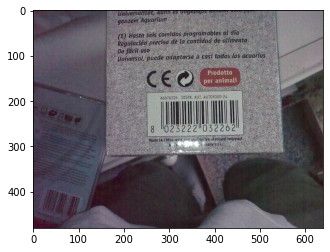

In [ ]:
from IPython.display import Image
from google.colab import files
from io import BytesIO
from PIL import Image
test_img = Image.open(BytesIO(uploaded['예시.png'])).convert("RGB")
plt.imshow(test_img)
plt.show()

<Prediction>


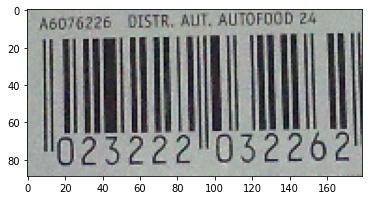

In [ ]:
test_image_img=test_img
test_image = np.array(test_image_img)
test_image_real = np.array(test_image_img)

to_tensor = torchvision.transforms.ToTensor()

test_image = to_tensor(test_image).unsqueeze(0)

targets = []

model.eval()
predictions = model(test_image.to(device))
boxes = predictions[0]['boxes']
labels = predictions[0]['labels']


print("<Prediction>")
objects = []

for a,b in zip(objects, boxes):
  print(a,": ",b.tolist())

plot_image = test_image.squeeze().permute(1,2,0).numpy()
answer = makeBox(plot_image,boxes,objects)

answer_box=boxes[0]
crop = test_image_real[int(answer_box[1]):int(answer_box[3]), int(answer_box[0]):int(answer_box[2])]
plt.imshow(crop)
plt.show()

img = Image.fromarray(crop, 'RGB')
img.save("/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/data/barcode/BarcodeDatasets/1d_barcode_extended_plain/cut/sample.png")

In [ ]:
# train_norm_array, test_norm_array=normalize(crop,crop,scale="Y")
train_norm=[]
test_norm=[]
# img = tf.image.decode_jpeg(img, channels=3) 
img = tf.io.read_file("/content/drive/Shareddrives/🐣DATAMINING_22_1🐣/주제분석/data/barcode/BarcodeDatasets/1d_barcode_extended_plain/cut/sample.png")
# 압축된 문자열을 3D uint8 텐서로 변환
img_1 = tf.image.decode_jpeg(img, channels=3) 
# # 0~1 사이의 float 값으로 변환
img = tf.image.convert_image_dtype(img_1, tf.float32)
# 이미지를 원하는 크기로 조정합니다.
img=tf.image.resize(img, [256,256])
img_1=tf.image.resize(img_1, [256,256])
train_norm.append(img)  
train_norm_array = np.array(train_norm)
test_norm.append(img_1)  
test_norm_array = np.array(test_norm)

train_norm_array[0] = salt_and_pepper(train_norm_array[0])
test_norm_array[0]= salt_and_pepper(test_norm_array[0])

# Test Dataset에 대한 노이즈 낀 Dataset 생성
# noise = np.random.normal(loc=1, scale=1, size=(len(test_norm_array),256,256,3))
# x_test_noisy = test_norm_array + noise

x_decoded = autoencoder.predict(train_norm_array)

In [ ]:
test_norm_array[0].shape

(256, 256, 3)

In [ ]:
predict_image=x_decoded.reshape(x_decoded.shape[0],256,256,3)
predict_image_1=test_norm_array[0].reshape(1,256,256,3)
predict_image=predict_image*255
x = predict_image[0].astype("uint8")
noise_image=predict_image_1[0].astype("uint8")
fig=plt.figure(figsize=(5,5))

<Figure size 360x360 with 0 Axes>

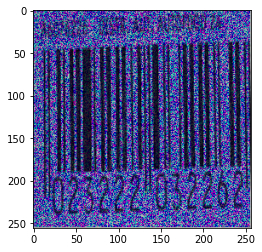

In [ ]:
# test_img, crop, x, img_1
plt.imshow(noise_image)
plt.show()

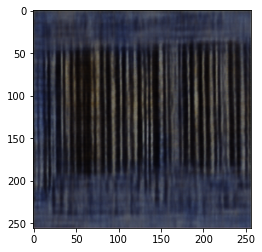

In [ ]:
plt.imshow(x)
plt.show()

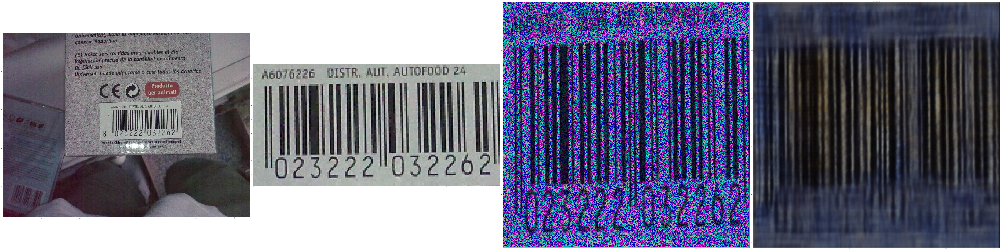

In [ ]:
image=[test_img, crop,noise_image,x]
ment=["raw","cropped image","noise image","denoising image"]

rows=5
cols=5
fig=plt.figure(figsize=(200,300))
for i in range(len(image)) :
    fig.add_subplot(rows,cols,i+1)
    plt.title(ment[i])
    plt.imshow(image[i])
fig.tight_layout()
plt.show()